# Ethene Molecule  <br>

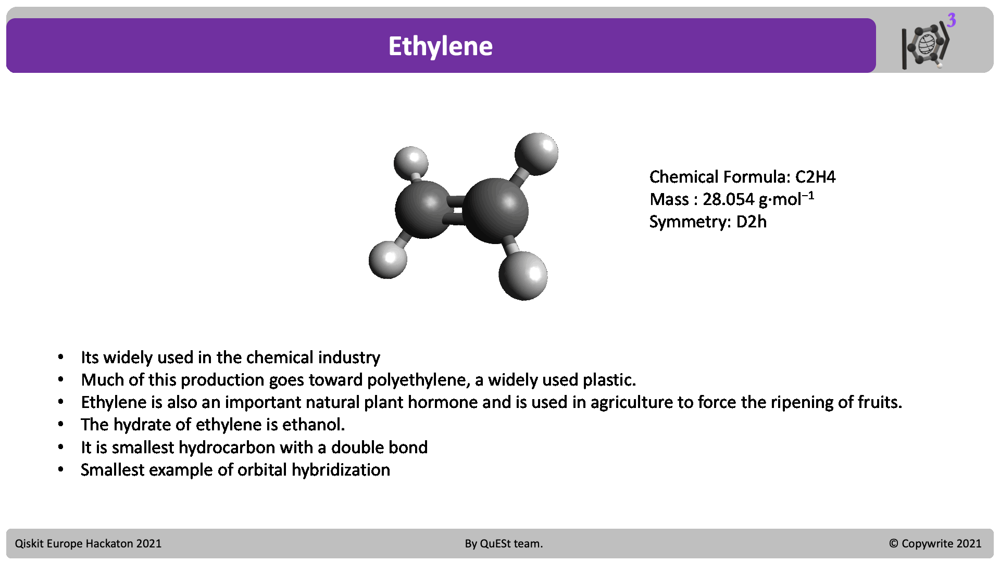

The following notebook aims to explain the process of calculating slight bigger molecular systems using the __Active Space Transformer__ Function.<br>
This initiates the process of __Embedding__ which will allow us to compute energies of certain electrons and molecular orbitals (MO's) in a quantum computer, leaving the rest of the MO's to be calcualted classically. 

The following notebook is divided in:
1. Libraries and certain considerations
1. Defintion of the molecule using PySCF
1. Defining the Hartree-Fock problem "Classically"
1. Analyze the Molecular Orbitals for Active Space
1. Embedding and Electronic Structure problem
1. The Quantum-Active Space
1. Defining the Hartree-Fock problem "Quantum"
1. Mapping your problem to Qubits
1. The Variational Quantum Eigensolver (VQE)
    1. Initialize your Quantu-Hartree Fock State
    1. Physical and Heuristic Ansatz
    1. Optimizers
1. Solving the Groundstate
    1. Classical Eigensolver (Numpy)
    1. Local-VQE (Qiskit-Nature)
    1. IBMQ-Backends (IBMQ Experience)
1. View Results
    1. What to compare
    1. What to look for
    


## Libraries

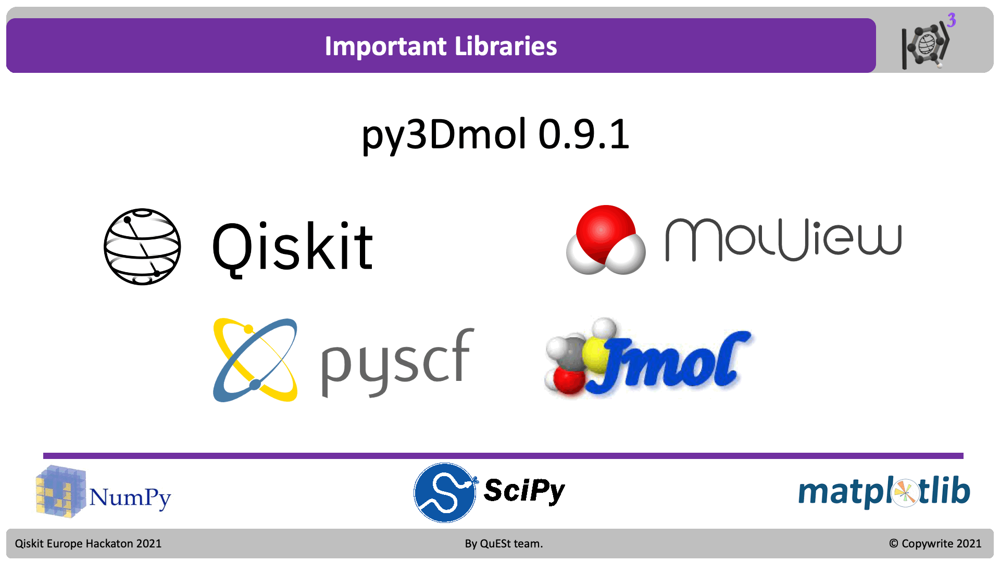

Needless to say, the installation of Qiskit, Qiskit-Nature, PySCF, py3Dmol are important for the full functionally of this notebook as well as common python science libraries. 


In [1]:
import sys
import time
from pyscf import gto, scf, mcscf, mp, cc, dft, ao2mo, lo, fci
from pyscf.tools import molden, cubegen
from pyscf.geomopt.geometric_solver import optimize
import numpy as np
from qiskit_nature.drivers import PySCFDriver, UnitsType, Molecule,  HFMethodType
from qiskit_nature.problems.second_quantization.electronic import ElectronicStructureProblem
from qiskit_nature.converters.second_quantization import QubitConverter
from qiskit_nature.mappers.second_quantization import ParityMapper
from qiskit_nature.transformers import ActiveSpaceTransformer, FreezeCoreTransformer
from qiskit.algorithms import NumPyMinimumEigensolver
from qiskit_nature.algorithms.ground_state_solvers import GroundStateEigensolver
#import basis_set_exchange

# qiskit
from qiskit.utils import QuantumInstance
from qiskit import Aer
from qiskit.algorithms.minimum_eigen_solvers import NumPyMinimumEigensolver, VQE
from qiskit.algorithms.optimizers import SLSQP
from qiskit.circuit.library import ExcitationPreserving
from qiskit import BasicAer
from qiskit.algorithms import NumPyMinimumEigensolver, VQE
from qiskit.algorithms.optimizers import SLSQP

# qiskit nature imports
from qiskit_nature.problems.second_quantization import ElectronicStructureProblem
from qiskit_nature.converters.second_quantization import QubitConverter
from qiskit_nature.mappers.second_quantization import JordanWignerMapper
from qiskit_nature.algorithms import GroundStateEigensolver
from qiskit_nature.drivers import PySCFDriver, UnitsType, Molecule
from qiskit_nature.algorithms.pes_samplers import BOPESSampler, Extrapolator

# Defining a PySCF molecule

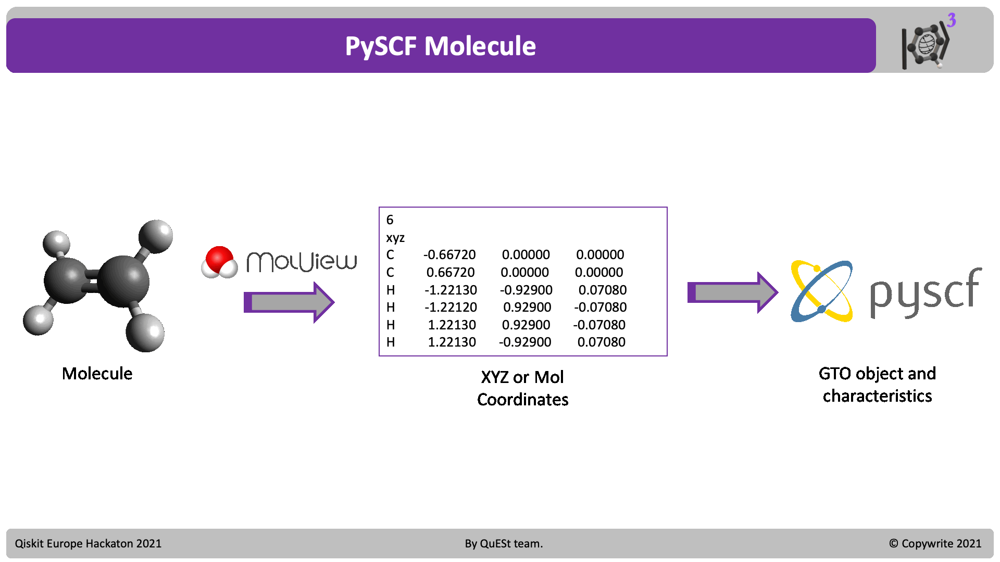

You can design your structure online or upload any coordinates of your structure. <br>
The allowed format for PySCF molecules come in the XYZ for Mol format. <br>
In PySCF you can define very important features of your classical calculation:
* symmetry --> Set to True
* spin 
* charge
* unit (set to Angstroms)
* name of output
* basis set --> __Very important!__

In [2]:
#Function to define a molecule with the GTO class
def my_pyscf_mol(xyz ,symmetry, spin, charge, units, basis, output):
    my_molecule = gto.Mole()
    my_molecule.fromfile(str(xyz))
    my_molecule.symmetry = symmetry
    my_molecule.spin = spin
    my_molecule.charge = charge
    my_molecule.unit = units
    my_moleculeverbose = 1 
    my_molecule.basis = basis
    my_molecule.output = output
    my_molecule.build()
    return my_molecule

In [3]:
#Read HF Optimized structures

opt_sto3g = my_pyscf_mol(xyz="Ethene_Monomer.xyz",
                         symmetry=True,
                         spin=0, 
                         charge=0, 
                         units='A', 
                         output='opt_sto3g.out',
                         basis='sto3g')


overwrite output file: opt_sto3g.out


Now we calculate the meand field. <br>
We decide to calculate a Restrictired Shell Hartree-Fock simulation

In [4]:
#STO-3G Basis set
mf_opt_sto3g = scf.RHF(opt_sto3g)
mf_opt_sto3g.kernel()

-77.07229614334861

# Understand the HF problem Classically

Lets generate the MO diagram of the problem of interest

<div class="alert alert-block alert-info">
<b>Tip:</b>Be aware that the MO's are determined by the basis set.
    Basis sets have a long developing history and have a high varierty. 
    We develop this problem with the simplest and most pictographical of the basis sets.
</div>

Plenty of basis sets are available in PySCF in __[here](https://github.com/pyscf/pyscf/tree/master/pyscf/gto/basis)__ <br>
<br>
With STO-3G you get 14 Orbitals for C2H4, 8 Occupied and 6 Unoccupied <br>
<br>
This part is important to understand for the Active Space formulation <br>
<br>
The results are vizualized in the plot you'll se below. 


([], [])

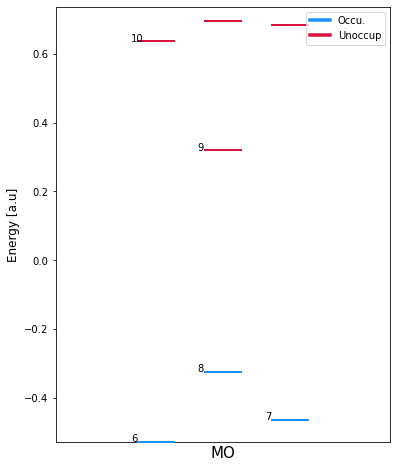

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

#Energies and occupation 
Energies = mf_opt_sto3g.mo_energy # Energies
Occupation = mf_opt_sto3g.mo_occ/2 # Number of occupied orbitals
Orbital_number = int(len(Occupation)) # Number of orbitals within the basis set used

x = np.zeros(len(Energies))
#Get to arrays with occupied and unoccupied MO
counter=np.sum(Occupation)  
occ_mo = Energies[0:int(counter)]
x_occ = np.zeros(len(occ_mo))
unocc_mo = Energies[int(counter):len(Energies)]
x_unocc = np.zeros(len(unocc_mo))

mo_numbers = np.arange(len(Energies)) + 1


x_new = np.zeros(len(Energies))
i = 0
while i < len(Energies)-1:
    temp = Energies[i]-Energies[i+1]
    temp = np.abs(temp)
    if temp > 0.2:
        x_new[i] = 0
        i = i + 1
    elif temp < 0.2:
        x_new[i] = -0.04
        x_new[i+1] = 0.04
        i = i+2

x_occ = x_new[0:int(counter)]
x_unocc = x_new[int(counter):len(Energies)]
#Plotting occupied and unoccupied in red and blue
plt.figure(figsize=(6,8))
plt.scatter(x_occ, occ_mo, c='dodgerblue', s=1444, marker="_", linewidth=2, zorder=3)
plt.scatter(x_unocc, unocc_mo, c='crimson', s=1444, marker="_", linewidth=2, zorder=3)

#Define limits
low_lim = int(counter)-2 # HOMO-2
top_lim = int(counter)+2 # LUMO+2

if top_lim > Orbital_number:
    top_lim = Orbital_number

if low_lim < 0:
    low_lim = 0

#Put the index of a range HOMO-2 and LUMO+2 (This can be an option)
for i in np.arange(low_lim,top_lim+1):
    index =int(i-1)
    text = str(i)
    plt.annotate(text, xy=(x_new[index],Energies[index]),xytext=(x_new[index]-0.015,Energies[index]) ,xycoords='data' )


plt.ylabel('Energy [a.u]',fontsize=12) 
plt.xlabel('MO',fontsize=15)
legend_elements = [Line2D([0], [0], color='dodgerblue',lw=3.5, label='Occu.'), Line2D([0], [0], color='crimson',lw=3.5, label='Unoccup'),]
plt.legend(handles=legend_elements,loc='upper right', fontsize=12 ,prop={'size': 10} , ncol=1, fancybox=True)
#Put the limits in y- HOMO-3 and LUMO+4 (This can be an option)
plt.ylim(Energies[low_lim-1],Energies[top_lim-1]+0.1) 
plt.xlim(-0.1,0.1) 
plt.xticks([])

# Visualization of the Molecular Orbitals

For clarity and to follow a more pictographic path, we take a look at each of the MOs. <br>

Especially if they are close to the Fermi level. <br>

That is, around MO's 7, 8, 9, 10. <br>

For your comfort and curiosity, you can visualize the isosurface of the MOs wavefunctions. <br>


In [6]:
#Function to read XYZ files
def readXYZ(file):
    f = open(file, "r")
    lines = f.readlines()
    filelength = len(lines)
    progress = 0
    geomcount = 0
    geom = []
    while progress < filelength:
        tmpgeom = ""
        length = int(lines[progress])+2
        rangestart = progress
        rangeend = progress + length
        for i in range(rangestart, rangeend):
            tmpgeom = tmpgeom + lines[i]
        geom = geom + [tmpgeom]
        geomcount = geomcount + 1
        progress = progress + length
    f.close()
    return(''.join((geom)))

In [7]:
#Interactive selection of the functional of Interest
from __future__ import print_function
import py3Dmol
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

In [8]:
def f(x):
    index_i = int(x)-1
    cubegen.orbital(opt_sto3g, 'temp.cube', mf_opt_sto3g.mo_coeff[:,index_i])
    orbital_mol = open("temp.cube", "r").read()
    v = py3Dmol.view()
    v.addVolumetricData(orbital_mol, "cube", {'isoval': -0.02, 'color': "red", 'opacity': 0.75})
    v.addVolumetricData(orbital_mol, "cube", {'isoval': 0.02, 'color': "blue", 'opacity': 0.75})
    geom = readXYZ("Ethene_Monomer.xyz")
    v.setStyle({'stick':{}})
    v.zoomTo()
    v.addModel(geom,"xyz")
    v.setStyle({'stick':{}})
    v.show()

In [9]:
#You can remove the comment to the different orbitals
interact(f, x=mo_numbers);

interactive(children=(Dropdown(description='x', options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14), value…

# Hartree-Fock Embedding 

## A recent __[publication](https://aip.scitation.org/doi/10.1063/5.0029536)__ of a method shows how to simulate bigger molecules with a strong degree of accuracy

It goes like this:

- Definition of Inactive and Active space 

We derive the so-called inactive Fock operator. The goal of this operator is to embed the quantum computation into a classically computed environment treated at the HF level of theory, through the notion of an AS.

The total electronic energy, $E$, is defined by the expectation value of the system Hamiltonian, $\hat{H} $
$$E = ⟨Ψ∣H∣Ψ⟩ = \sum_{pq} h_{pq}D_{pq} + \frac{1}{2} \sum_{pqrs} g_{pqrs}d_{pqrs}$$,
where $Ψ$ is the wavefunction, $h_{pq}$ and $g_{pqrs}$ are the one- and two- electron integrals, respectively, and D and d are the one- and two- particle density matrices.

$h_{pq}\rightarrow$ One electron Integral <br>
$g_{pqrs}\rightarrow$ Two electron Intagral <br>

To achieve the implementation of the HF embedding, we split the one-electron density (D) into an active and inactive part, $D = D^A+D^I$
In the MO basis, the latter simplifies to $D_{iq} = 2δ_{iq}$, where we
use Helgaker’s index notation in which __i, j, k, l__ denote inactive, __u, v, x, y__ denote active, and __p, q, r, s__ denote general MOs.<br>

Inactive | Active | MO |
:-------:|:------:|:-----:
i | u | p
j | v | q
k | x | r
l | y | s

The one electron contribution is:
$$ \sum_{pq} h_{pq}D_{pq} = \sum_{vq}h_{vq}D_{vq}^A + \sum_{jq}h_{jq}D_{jq}^I $$  we use the fact that a density matrix element vanishes when any of its indices correspond to a virtual orbital to obtain:
$$ \sum_{pq} h_{pq}D_{pq} = \sum_{uv}h_{uv}D_{uv}^A + 2 \sum_{jq}h_{jj} $$

and the two electorn contribution is:
$$ \frac{1}{2} \sum_{pqrs}g_{pqrs}d_{pqrs} =\frac{1}{2} \sum_{pqjs}g_{pqjs}d_{pqjs} + \frac{1}{2} \sum_{jqus}g_{jqus}d_{jqus} + \frac{1}{2} \sum_{vqus}g_{vqus}d_{vqus} $$

__one important point__ is how to represent the two electron density matrices using one electron density matrices. <br>
Express the two-electron density matrices in terms of one-electron ones: <br>
$$d_{pqjs} = (2\rho_{js}- \rho_{qj} \rho_{sq})D_{pq}$$
$$d_{jqus} = (2\rho_{qj} \rho_{sq}- \rho_{sj})D_{uq}$$

The Inactive Fock Operator is then:<br>

$$F_{pq}^{I} = h_{pq} + \sum_{i}(2g_{iipq}-g_{iqpi})$$

and its energy is: <br>

$$ E^I = \frac{1}{2}\sum_{ij}(h_{jj}+F_{ij}^I)D_{ij}^I $$

as such, we redifine our total energy as: <br>

$$ E = E^I + \sum_{uv}F_{uv}^I D_{uv}^A + \frac{1}{2}\sum_{uvxy} g_{uvxy}d_{uvxy}^A $$ 

and at last our hamiltonian is then: <br>

$$ \hat{H} =\sum_{uv}F_{uv}^I \hat{a}_u^\dagger\hat{a}_v + \sum_{uvxy}g_{uvxy} \hat{a}_u^\dagger \hat{a}_v^\dagger \hat{a}_x \hat{a}_y $$

__This $\hat{H}$ will go into the quantum computer now.__


# Qiskit Nature and PySCF driver

This step is the link between the classical computation in PySCF and the quantum computing process taken over by IBMQ. <br>

The class `Molecule` defines __QMolecule__ which is Qiskit definition of the molecule.<br>
The driver `PySCFDriver` translates the information of the Qmolecule object from the PySCF library.<br> 
The hf_method parameter defines the if the restricted (RHF), unrestircted (UHF) or restricted-open (ROHF) configurations are used <br>
Finally, by running the driver we form the new Qmolecule object for Qiskit Nature. 


In [10]:
from qiskit_nature.drivers import PySCFDriver, UnitsType, Molecule , HFMethodType

#using the class Molecule (From Qiskit Nature) we can make an object for PySCFDriver
#opt_sto3g is the GTO objectr from PySCF , in this case the optimized structure

molecule = Molecule(geometry= opt_sto3g.atom ,charge=0, multiplicity=1)  

#We call the PySCFDriver and we provided our define molecule object (molecule)
#Within the driver we define the units (ANGSTROM), basis using the GTO PySCF driver and hf_method RHF UHF or ROHF

driver = PySCFDriver(molecule=molecule, unit=UnitsType.ANGSTROM, basis=opt_sto3g.basis, hf_method=HFMethodType.RHF)

# #Running PySCF it prints convergence True or False (Important), Total Energy , Electronic dipole and Total dipole
#run PySCF with the use of the PySCFDriver and what we will know as quantum molecule 
q_molecule = driver.run()

# Quantum-Active-Space

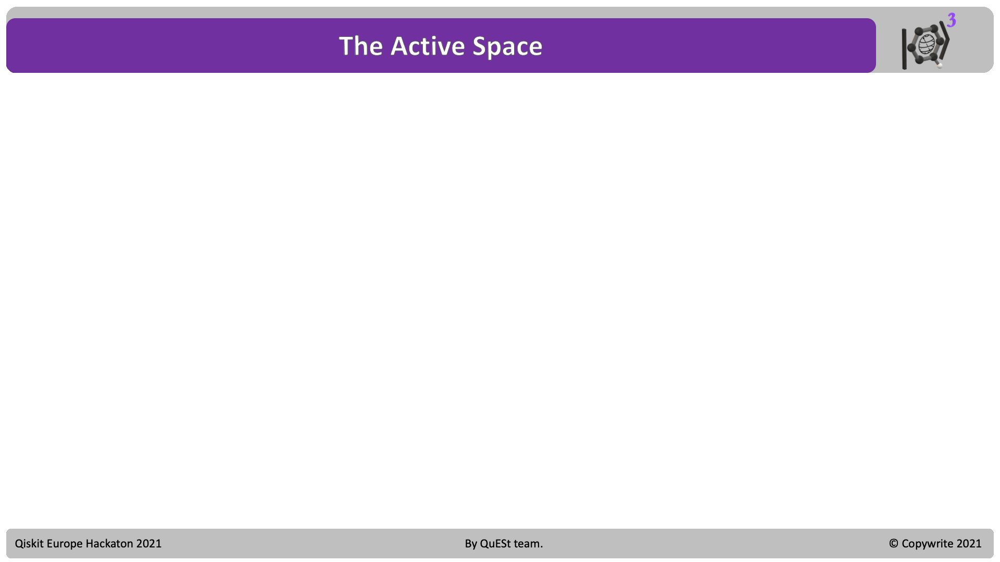

By calling the function `ActiveSpaceTransformer` you can customize your quantum active space.

* `num_electrons`= (n)  
     - The number of active electrons. If this is a tuple, it represents the number of alpha and beta electrons.
* `num_molecular_orbitals`(n)
    - The number of active orbitals
* `active_orbitals`=[int,int,int,int]
    - A list of indices specifying the molecular orbitals of the active space

C2H4 with the STO-3G basis set has 14 MO orbitals, where 8 are occupied. <br>
In this example we want to use 4 occupied electrons and 4 orbitals to simulate. <br>


In [11]:
#Based on the number of MO within the basis define the occupied and unoccupied virtuals 

#ActiveSpaceTransformer will be use to selected the active space from the q_molecule MO representation
#You can define as (2,3) (#electrons, #orbitals) 
#The selection of the MO is around the HOMO
active_space_trafo = ActiveSpaceTransformer(num_electrons=4,num_molecular_orbitals=4, active_orbitals=None)

#Another option is to specificalle define the index of the MO orbitals
#active_space_trafo_2_3 = ActiveSpaceTransformer(num_electrons=2,num_molecular_orbitals=3,active_orbitals=[4,5,6])

#Example (4,4) , Active Space HOMO-1, HOMO, LUMO and LUMO+1 (4,5,6,7 from the MO Energy diagram displayed above)
#active_space_trafo_4_4 = ActiveSpaceTransformer(num_electrons=2,num_molecular_orbitals=4)


# Mapping the second quantization problem

The translation of the recently computed hamiltonian into the qubit formalism is called Mapping. <br>

This part __is__ where things get _quantum_ quantum, not _classically_ quantum, if you know what I mean. 

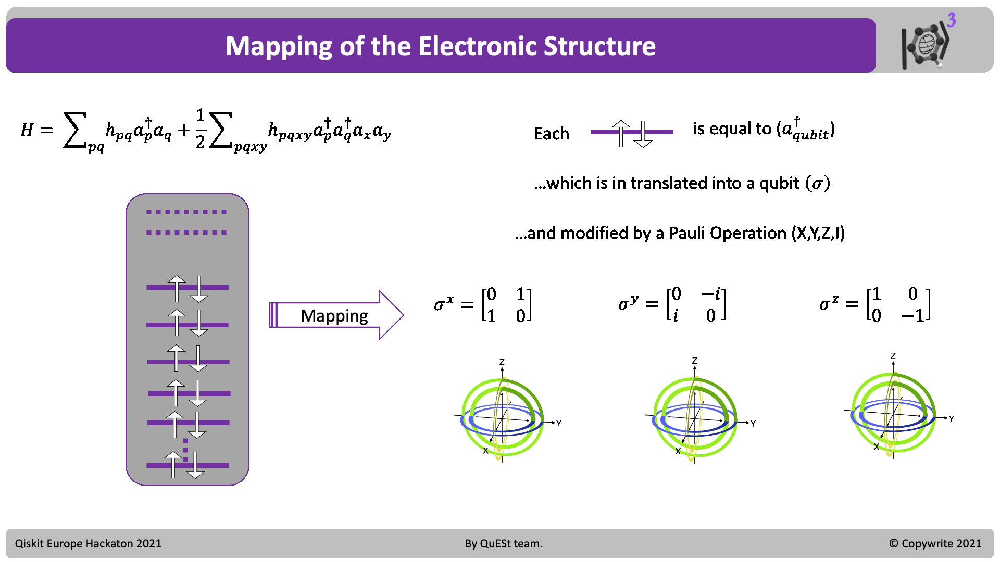

by the way, these AMAZING animations of gates are a masterpiece of _[Casey Duckering](https://github.com/cduck)_

Here is an important step in your calculation. <br>
You can customize your electronic structure probem and its paramenters like Quantum Active space. <br>
Using `ElectronicStructureProblem` you need to call your _driver_ which if you remember, has the information of your entire molecule and its characteristics from PySCF into Qiskit.<br>
_q_molecule_transformers_ is a list where you pass the fucntion `ActiveSpaceTransformer`<br>

__Important__ If you pass only the _driver_ without the Quantum Active space you will require all the MOs to be transformed to quibits. 
Compare using it which requires ony 6 qubits, with 28 qubits required for a full quantum calculation

In order to learn more about how is the second quantization formed in the qubit formalism, take a look in the class `.second_q_ops()` if the `ElectronisStructureProblem` function. 

The indexes of `.second_q_ops()[n]` are for n:
* Electronic Structure operator a.k.a. “Hamiltonian” or 𝐻
* Total Magnetization operator
* Total Angular Momentum operator
* Total Particle Number operator
* x Dipole operator
* y Dipole operator
* z Dipole operator



In [12]:

#Defining the electronic structure problem 
# We provide our PySCFDriver object and the active space (q_molecule_transformers)

es_problem = ElectronicStructureProblem(driver, q_molecule_transformers=[active_space_trafo])

# If we want to consider all the MOs for the qubit simulation, we do not use q_molecule_transformes
# es_problem = ElectronicStructureProblem(driver)

# Generate the second-quantized operators
second_q_ops = es_problem.second_q_ops()

# Hamiltonian
main_op = es_problem.second_q_ops()[0]

print(main_op)

  ++--IIII * (0.0054968815974945065+0j)
+ +-+-IIII * (-0.006988847787710562+0j)
+ +--+IIII * (0.0014919661902160178+0j)
+ +-II+-II * (0.008683101772372581+0j)
+ +-II+I-I * (1.1549407843178087e-06+0j)
+ +-II-+II * (-0.008683101772372581+0j)
+ +-II-I+I * (-1.1549407843178087e-06+0j)
+ +-III+I- * (1.1535946452248189e-06+0j)
+ +-III-I+ * (-1.1535946452243852e-06+0j)
+ +-IIII+- * (0.0068397289751179705+0j)
+ +-IIII-+ * (-0.0068397289751179705+0j)
+ +I-I+-II * (1.1549407843178087e-06+0j)
+ +I-I+I-I * (0.011309976507716207+0j)
+ +I-I-+II * (-1.154940784317592e-06+0j)
+ +I-I-I+I * (-0.011309976507716205+0j)
+ +I-II+I- * (0.00833169516533399+0j)
+ +I-II-I+ * (-0.008331695165333988+0j)
+ +I-III+- * (1.349952093238115e-06+0j)
+ +I-III-+ * (-1.3499520932383317e-06+0j)
+ +II-+II- * (0.054115024650205464+0j)
+ +II--II+ * (-0.05411502465020549+0j)
+ +II-I+-I * (0.013828576762828497+0j)
+ +II-I-+I * (-0.013828576762828532+0j)
+ +II-IIII * (-2.508044995364056e-05+0j)
+ +II-IIIN * (4.475293728449861e-06

# QubitConverter

Once we the second-quantization representation, we must translate this into a Quantum computing circuits. In order to simulate our MOs in a quantum computer. <br>
All known elementary and composite particles are bosons or fermions, depending on their spin: Particles with half-integer spin are fermions; particles with integer spin are bosons. In Quantum computing there are different algorithms to "mapped" this second quantize representation into qubits depending if the problems are Fermions or Bosons, since we are working with electrons (Fermions) we will use a selected group of Mapping algorithms for Fermion problems.

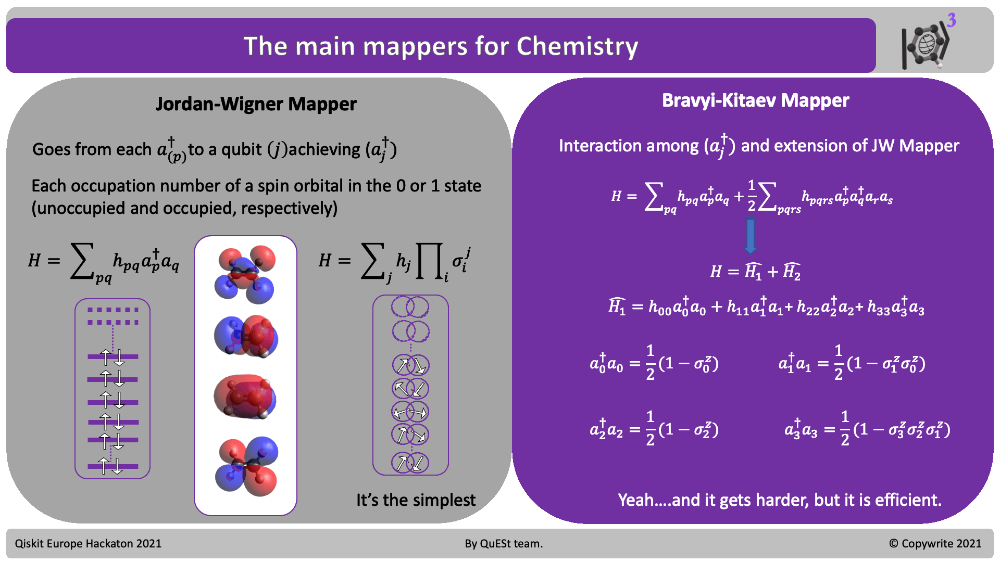

The `QubitConverter` is called to define the translate of your second quantization operators using the defined mapping. 
* `Mapper`:
    - We strongly suggest to stick with 'JordanWignerMapper' or with 'BravyiKitaevMapper' which are praised in the literature as the most relevant for quantum chemical simulation.
* `two_qubit_reduction`:
    - Is it s popular technique which uses ***** techniques to substract two or three qubits from the calculations
* `z2symmetry_reduction`:
    - Can be set into 'auto' which will automaticall look for symmetries, this technique can be also customized, but the correct symmetries need to be added. 
    

In [13]:
from qiskit_nature.mappers.second_quantization import ParityMapper, BravyiKitaevMapper, JordanWignerMapper
from qiskit_nature.converters.second_quantization.qubit_converter import QubitConverter

# Setup the mapper and qubit converter
#For the choices we should have 3 ParityMapper, JordanWignerMapper and FermionicMapping
mapper_type = 'JordanWignerMapper'

if mapper_type == 'ParityMapper':
    mapper = ParityMapper()
elif mapper_type == 'JordanWignerMapper':
    mapper = JordanWignerMapper()
elif mapper_type == 'BravyiKitaevMapper':
    mapper = BravyiKitaevMapper()

converter = QubitConverter(mapper=mapper, two_qubit_reduction=True)

# The fermionic operators are mapped to qubit operators
num_particles = (es_problem.molecule_data_transformed.num_alpha,
             es_problem.molecule_data_transformed.num_beta)
qubit_op = converter.convert(main_op, num_particles=num_particles)

# Starting the VQE 

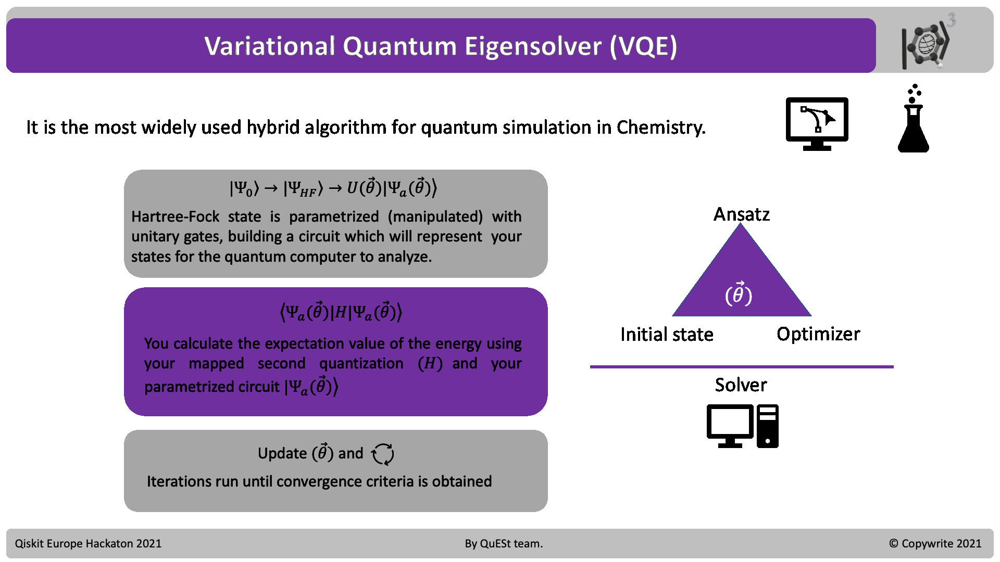

# Describing an Initial State

For our simulations, we will define an initial state for the mapped problem. 
Since, we are simulating a molecule. We know that the best initial guess is to have all electrons occupying the lowest orbitals (Hund's rule).<br>

In this section, since we will give the initial state using the class `HartreeFock` 
- Electrons should occupy the lowest orbitals

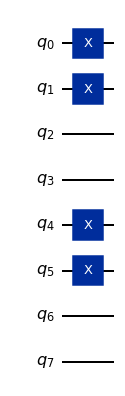

In [14]:
from qiskit_nature.circuit.library import HartreeFock

num_particles = (es_problem.molecule_data_transformed.num_alpha,
             es_problem.molecule_data_transformed.num_beta)
num_spin_orbitals = 2 * es_problem.molecule_data_transformed.num_molecular_orbitals
init_state = HartreeFock(num_spin_orbitals, num_particles, converter)
init_state.draw('mpl', style='iqx')

# Ansatz

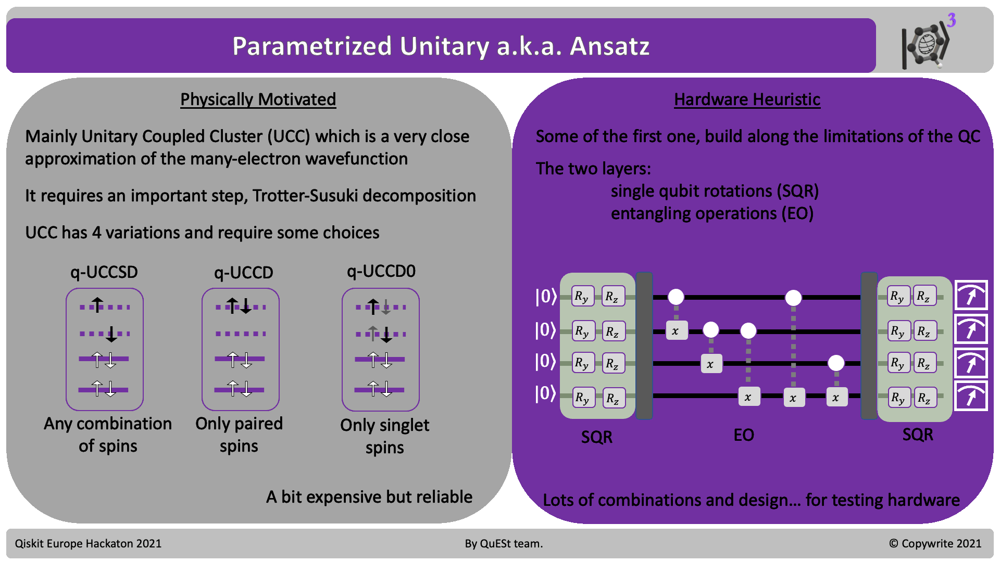

This a complex field, and its explanation is nothing close than trivial. 

Recomended Types:
* _[UCC(SD)](https://aip.scitation.org/doi/10.1063/1.5141835)_
* _[EfficientSU2](https://arxiv.org/abs/1309.2736)_


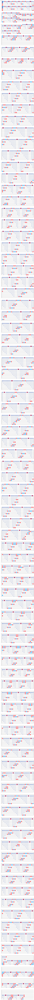

In [15]:
from qiskit.circuit.library import TwoLocal
from qiskit_nature.circuit.library import UCCSD, PUCCD, SUCCD
from qiskit.circuit.library import EfficientSU2

# Choose the ansatz
ansatz_type = "UCCSD"

# Put arguments for twolocal
if ansatz_type == "TwoLocal":
    # Single qubit rotations that are placed on all qubits with independent parameters
    rotation_blocks = ['ry', 'rz']
    # Entangling gates
    entanglement_blocks = 'cx'
    # How the qubits are entangled 
    entanglement = 'full'
    # Repetitions of rotation_blocks + entanglement_blocks with independent parameters
    repetitions = 3
    # Skip the final rotation_blocks layer
    skip_final_rotation_layer = True
    ansatz = TwoLocal(qubit_op.num_qubits, rotation_blocks, entanglement_blocks, reps=repetitions, 
                      entanglement=entanglement, skip_final_rotation_layer=skip_final_rotation_layer)
    # Add the initial state
    ansatz.compose(init_state, front=True, inplace=True)
    
elif ansatz_type == "UCCSD":
    ansatz = UCCSD(converter,num_particles,num_spin_orbitals,initial_state = init_state)
    
elif ansatz_type == "PUCCD":
    ansatz = PUCCD(converter,num_particles,num_spin_orbitals,initial_state = init_state)
    
elif ansatz_type == "SUCCD":
    ansatz = SUCCD(converter,num_particles,num_spin_orbitals,initial_state = init_state)
    
elif ansatz_type == "EfficientSU2":
    ansatz = EfficientSU2(num_qubits=qubit_op.num_qubits, reps=2, entanglement='full', insert_barriers=True)
    
ansatz.draw('mpl', style='iqx')

## Backend and the IBMQ Experience

Now that you have $\psi(\vec\theta)$ and $\hat{H}$ in the translated is time to chose the solvers. <br>
As as well as the possible services that you have in the IBMQ experience service. <br>

Nunerical solutions can be obtained localy using two solvers `NumPyMinimumEigensolver()` or numerical VQE using `QasmSimulatorPy()` as a backend

First of all you need to get an _[account](https://quantum-computing.ibm.com)_ at IBMQ experience andn get access to the service and a complete spectrum if rescources to start working with real quantun computers. <rb>

Once you have access to your API Token you can copy it in credentials('API_token'). <br>
Now you need to look at your allowed providers by instanting its class. <br>
This will later allow access to the backends, where the job will take place. <br>
The list is divided in two main sections:
* Simulators
    - Numerical simulators of several qubits and with specifil representations 
    - Specific to problems
    - Easier access
* Systems
    _ Limited number of qubits (max 15)
    - Experimental error analysis
    - Eror correction implementaton algoritms
    - Longer queue




In [23]:
from qiskit import Aer
from qiskit import IBMQ
from qiskit.providers.aer.noise import NoiseModel
from qiskit.utils import QuantumInstance
from qiskit.ignis.mitigation.measurement import CompleteMeasFitter
from qiskit.providers.basicaer import QasmSimulatorPy 


Credentials=('305add5f5e4c73952e2c346791b411854c6266a6680a61e2741fb8d8d14bff63073c54ceff78abafb526fd982eaab9488250ed3bf742876c5b5a82a47cfdf2a2')

IBMQ.load_account()


<AccountProvider for IBMQ(hub='ibm-q', group='open', project='main')>

# Optimizer

In the case of optimizers, long can be discussed about the behavior of each parameters. <br> 
For most of them the origina documentation is easily accessible.<br>
* _['L_BFGS_B'](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.fmin_l_bfgs_b.html)_
* _[COBYLA](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html)_
* _['SPSA'](https://www.jhuapl.edu/SPSA/)_
* _['SLSQP'](https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.minimize.html)_

The number of iterations is just a simple parameter to approximate, buta longer iteration number than that would require problem reformulation


In [17]:

from qiskit.algorithms.optimizers import COBYLA, L_BFGS_B, SPSA, SLSQP

optimizer_type = 'L_BFGS_B'

# You may want to tune the parameters 
# of each optimizer, here the defaults are used
if optimizer_type == 'COBYLA':
    optimizer = COBYLA(maxiter=500)
elif optimizer_type == 'L_BFGS_B':
    optimizer = L_BFGS_B(maxfun=500)
elif optimizer_type == 'SPSA':
    optimizer = SPSA(maxiter=500)
elif optimizer_type == 'SLSQP':
    optimizer = SLSQP(maxiter=500)

# Solving the Ground State Energy

We call the function `GroundStateEigensolver` which requires inputs:<br>
* converter
    - Which is the problem mapped and translated in the correct formalism
* solver
    - The engine which will simulate or coordinate the quantum computation of the quantum circuit generated by the ansatzs and qubit converter
    * NumPyMinimumEigensolverFactory()
    * NumPyMinimumEigensolver()
    * QasmSimulatorPy()
    * IBMQ_Backends
        - Simulators
        * ibmq_qasm_simulator
        * simulator_statevector
        * simulator_stabilizer
        -Systems
        * ibmq_manila
        * ibmq_santiago
        * 1bmq_16_melbourne


# Classical solution

In [18]:
from qiskit_nature.algorithms.ground_state_solvers.minimum_eigensolver_factories import NumPyMinimumEigensolverFactory
from qiskit_nature.algorithms.ground_state_solvers import GroundStateEigensolver
import numpy as np 

def exact_diagonalizer(problem, converter):
    solver = NumPyMinimumEigensolverFactory()
    calc = GroundStateEigensolver(converter, solver)
    result = calc.solve(problem)
    return result

result_exact = exact_diagonalizer(es_problem, converter)
exact_energy = np.real(result_exact.eigenenergies[0])
print("Exact electronic energy", exact_energy)
print(result_exact)

Exact electronic energy -4.0119475076527475
=== GROUND STATE ENERGY ===
 
* Electronic ground state energy (Hartree): -110.488118582658
  - computed part:      -4.011947507653
  - ActiveSpaceTransformer extracted energy part: -106.476171075005
~ Nuclear repulsion energy (Hartree): 33.369333067471
> Total ground state energy (Hartree): -77.118785515187
 
=== MEASURED OBSERVABLES ===
 
  0:  # Particles: 4.000 S: 0.000 S^2: 0.000 M: 0.000
 
=== DIPOLE MOMENTS ===
 
~ Nuclear dipole moment (a.u.): [0.00018897  0.0  0.0]
 
  0: 
  * Electronic dipole moment (a.u.): [0.00018417  -0.00000265  0.0000002]
    - computed part:      [0.00049031  -0.00007902  0.00000602]
    - ActiveSpaceTransformer extracted energy part: [-0.00030614  0.00007637  -0.00000582]
  > Dipole moment (a.u.): [0.0000048  0.00000265  -0.0000002]  Total: 0.00000549
                 (debye): [0.00001221  0.00000674  -0.00000051]  Total: 0.00001395
 


# VQE and initial parameters for the ansatz

In [22]:
from qiskit.algorithms import VQE
from IPython.display import display, clear_output
from qiskit.providers.basicaer import QasmSimulatorPy 
from qiskit import Aer

backend = Aer.get_backend('statevector_simulator')



# Print and save the data in lists
def callback(eval_count, parameters, mean, std):  
    # Overwrites the same line when printing
    display("Evaluation: {}, Energy: {}, Std: {}".format(eval_count, mean, std))
    clear_output(wait=True)
    counts.append(eval_count)
    values.append(mean)
    params.append(parameters)
    deviation.append(std)

counts = []
values = []
params = []
deviation = []

# Set initial parameters of the ansatz
# We choose a fixed small displacement 
# So all participants start from similar starting point
try:
    initial_point = [0.01] * len(ansatz.ordered_parameters)
except:
    initial_point = [0.01] * ansatz.num_parameters

algorithm = VQE(ansatz,
                optimizer=optimizer,
                quantum_instance=backend,
                callback=callback,
                initial_point=initial_point)

result = algorithm.compute_minimum_eigenvalue(qubit_op)
print(result)


OrderedDict([   ('aux_operator_eigenvalues', None),
                ('cost_function_evals', 297),
                (   'eigenstate',
                    array([ 2.08584894e-19-2.05679253e-18j, -6.22335449e-17+4.88188034e-17j,
        3.58666317e-17+1.43335280e-18j,  1.05034627e-16+1.27957468e-18j,
       -1.69480814e-19-1.95349730e-18j, -3.32063121e-17-1.22159159e-17j,
       -1.16673452e-17-6.35244451e-17j,  2.54685368e-18-5.31246177e-17j,
       -4.76607245e-19+1.01223704e-20j, -1.64171363e-17+6.20091523e-18j,
       -1.64058363e-16+3.52025588e-17j, -1.36530694e-18+2.36908657e-17j,
        2.82334959e-18+1.70609309e-19j, -7.64549355e-18+8.51896604e-18j,
        3.10130829e-17+2.22392694e-17j, -1.54154348e-17+2.05464858e-17j,
        5.70213680e-18-3.15898858e-20j,  3.90407804e-17-5.65409829e-17j,
       -2.42749111e-17+2.76980820e-20j,  1.51765913e-15-8.19855193e-16j,
       -4.57057267e-19+1.61382451e-18j, -4.05665641e-17+1.57771471e-16j,
        4.41496178e-17+1.03329508e-16j, -3.59

# Simulation on the IBMQ Experience

__Please__ Be aware that online services require a queue and sometime long waiting lines for obtainig results. <br>
Be resonsible and be sensible with your usage of these services. <br>



In [30]:
IBMQ.providers() 
provider = IBMQ.get_provider(hub='ibm-q')  # replace by your runtime provider
print(provider.backends())
backend = provider.get_backend('ibmq_qasm_simulator') # < ------ this can also be a system
print(backend)
coupling_map = backend.configuration().coupling_map
#noise_model = NoiseModel.from_backend(backend.properties())
quantum_instance = QuantumInstance(backend=backend, 
                                   shots=1020)

algorithm = VQE(ansatz,
                optimizer=optimizer,
                quantum_instance=backend,
                initial_point=initial_point)

Q_vqe_groundstate_solver = GroundStateEigensolver(converter, algorithm)
Q_vqe_result = Q_vqe_groundstate_solver.solve(es_problem)
print('Energy:', np.real(Q_vqe_result.eigenenergies + Q_vqe_result.nuclear_repulsion_energy)[0])
vqeprogram_result = vqe_result.raw_result


[<IBMQSimulator('ibmq_qasm_simulator') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQBackend('ibmqx2') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQBackend('ibmq_16_melbourne') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQBackend('ibmq_armonk') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQBackend('ibmq_athens') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQBackend('ibmq_santiago') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQBackend('ibmq_lima') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQBackend('ibmq_belem') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQBackend('ibmq_quito') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQSimulator('simulator_statevector') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQSimulator('simulator_mps') from IBMQ(hub='ibm-q', group='open', project='main')>, <IBMQSimulator('simulator_extended_stabilizer') from IBMQ(hub

/Users/rcp/anaconda3/lib/python3.7/site-packages/qiskit/providers/ibmq/ibmqbackend.py:813: DeprecationWarning: Passing a Qobj to Backend.run is deprecated and will be removed in a future release. Please pass in circuits or pulse schedules instead.
  noise_model=noise_model, **run_config)
/Users/rcp/anaconda3/lib/python3.7/site-packages/qiskit/providers/ibmq/ibmqbackend.py:813: DeprecationWarning: Passing a Qobj to Backend.run is deprecated and will be removed in a future release. Please pass in circuits or pulse schedules instead.
  noise_model=noise_model, **run_config)
/Users/rcp/anaconda3/lib/python3.7/site-packages/qiskit/providers/ibmq/ibmqbackend.py:813: DeprecationWarning: Passing a Qobj to Backend.run is deprecated and will be removed in a future release. Please pass in circuits or pulse schedules instead.
  noise_model=noise_model, **run_config)
/Users/rcp/anaconda3/lib/python3.7/site-packages/qiskit/providers/ibmq/ibmqbackend.py:813: DeprecationWarning: Passing a Qobj to Back

KeyboardInterrupt: 